In [6]:
import pandas as pd
import librosa
from tqdm import tqdm
import numpy as np
import os
import matplotlib.pyplot as plt

# Before start using this notebook make sure that you the file features.csv in the same folder

In [2]:
df = pd. read_csv("features.csv",low_memory=False,header=[0,1,2])
df.head()

feature chroma_cens                                                    \
  statistics    kurtosis                                                     
      number          01        02        03        04        05        06   
0   track_id         NaN       NaN       NaN       NaN       NaN       NaN   
1          2    7.180653  5.230309  0.249321  1.347620  1.482478  0.531371   
2          3    1.888963  0.760539  0.345297  2.295201  1.654031  0.067592   
3          5    0.527563 -0.077654 -0.279610  0.685883  1.937570  0.880839   
4         10    3.702245 -0.291193  2.196742 -0.234449  1.367364  0.998411   

                                 ...   tonnetz                            zcr  \
                                 ...       std                       kurtosis   
         07        08        09  ...        04        05        06         01   
0       NaN       NaN       NaN  ...       NaN       NaN       NaN        NaN   
1  1.481593  2.691455  0.866868  ...  0.054125  0.012226  0.012111   5.758890   
2  1.366848  1.054094  0.108103  ...  0.063831  0.014212  0.017740   2.824694   
3 -0.923192 -0.927232  0.666617  ...  0.040730  0.012691  0.014759   6.808415   
4  1.770694  1.604566  0.521217  ...  0.074358  0.017952  0.013921  21.434212   

                                                          
        max      mean    median  min      skew       std  
         01        01        01   01        01        01  
0       NaN       NaN       NaN  NaN       NaN       NaN  
1  0.459473  0.085629  0.071289  0.0  2.089872  0.061448  
2  0.466309  0.084578  0.063965  0.0  1.716724  0.069330  
3  0.375000  0.053114  0.041504  0.0  2.193303  0.044861  
4  0.452148  0.077515  0.071777  0.0  3.542325  0.040800  

[5 rows x 519 columns]

<h3>Boites a moustache appliquees sur quelques facteurs</h3>

In [64]:
import plotly.graph_objects as go

fig = go.Figure()
features =('spectral_bandwidth','spectral_centroid','spectral_rolloff')
for i in features:
    
    dff=df[(i),('mean'),('01')]
    fig.add_trace(go.Box(y=dff,name=i))
    
fig.show()

<h3>Matrice de correlation</h3>

In [3]:
corr=df.loc[:,:].corr()
print('\n\nLa matrice de correlation :\n\n')
corr



La matrice de correlation :




chroma_cens                                          \
                           kurtosis                                           
                                 01        02        03        04        05   
chroma_cens kurtosis 01    1.000000  0.168040  0.072936  0.114748  0.087447   
                     02    0.168040  1.000000  0.256776  0.581978  0.563089   
                     03    0.072936  0.256776  1.000000  0.696866  0.243232   
                     04    0.114748  0.581978  0.696866  1.000000  0.590232   
                     05    0.087447  0.563089  0.243232  0.590232  1.000000   
...                             ...       ...       ...       ...       ...   
zcr         mean     01   -0.001692 -0.001086 -0.005155 -0.000912 -0.004149   
            median   01    0.001103  0.003289  0.000021  0.002799  0.000900   
            min      01    0.006344  0.004314  0.000966  0.000096 -0.000729   
            skew     01    0.025801  0.016010  0.019725  0.003503  0.048093   
            std      01   -0.009808 -0.011634 -0.016049 -0.008062 -0.009609   

                                                                           \
                                                                            
                               06        07        08        09        10   
chroma_cens kurtosis 01  0.055913  0.093210  0.046958  0.062980  0.135635   
                     02  0.374696  0.670683  0.249413  0.277566  0.386960   
                     03  0.159603  0.208861  0.093052  0.126101  0.108099   
                     04  0.412467  0.549015  0.193489  0.183819  0.093965   
                     05  0.682713  0.530515  0.191569  0.192796  0.222326   
...                           ...       ...       ...       ...       ...   
zcr         mean     01 -0.000639 -0.000600 -0.001312  0.006950 -0.006680   
            median   01  0.005873  0.004010  0.004069  0.015165 -0.000849   
            min      01 -0.000198  0.000075 -0.000354  0.005019  0.006823   
            skew     01  0.012586  0.017420  0.023715  0.030556  0.022298   
            std      01 -0.009060 -0.007351 -0.009298 -0.010939 -0.016175   

                         ...   tonnetz                           zcr  \
                         ...       std                      kurtosis   
                         ...        04        05        06        01   
chroma_cens kurtosis 01  ... -0.021042 -0.016246 -0.011776  0.059554   
                     02  ... -0.047317 -0.038900 -0.033791  0.027766   
                     03  ... -0.046026 -0.030043 -0.031115  0.034867   
                     04  ... -0.028608 -0.021130 -0.019762  0.013741   
                     05  ... -0.036079 -0.027037 -0.016971  0.134544   
...                      ...       ...       ...       ...       ...   
zcr         mean     01  ... -0.267163 -0.295029 -0.272125 -0.192219   
            median   01  ... -0.263548 -0.297247 -0.280942 -0.161773   
            min      01  ... -0.061446 -0.098449 -0.100751  0.009136   
            skew     01  ...  0.181227  0.215362  0.203798  0.785132   
            std      01  ... -0.105214 -0.104477 -0.076191 -0.111815   

                                                                           \
                              max      mean    median       min      skew   
                               01        01        01        01        01   
chroma_cens kurtosis 01 -0.005076 -0.001692  0.001103  0.006344  0.025801   
                     02 -0.013090 -0.001086  0.003289  0.004314  0.016010   
                     03 -0.015023 -0.005155  0.000021  0.000966  0.019725   
                     04 -0.012290 -0.000912  0.002799  0.000096  0.003503   
                     05 -0.011203 -0.004149  0.000900 -0.000729  0.048093   
...                           ...       ...       ...       ...       ...   
zcr         mean     01  0.302725  1.000000  0.939181  0.269567 -0.355198   
            median   01  0.151493  0.939181  1.000000  0.30

In [5]:
eigenVal=np.linalg.eigvals(corr)
eigenVal=-np.sort((-eigenVal/len(eigenVal)))
information = 0
i=0
data = {'Composante':[],'Total':[],'% de la variance':[],'% cumules':[]}
for i in range(len(eigenVal)):
    data['Composante'].append( '{:03d}'.format(i) )
    data['Total'].append( eigenVal[i] )
    data['% de la variance'].append( eigenVal[i]*100 )
    information += eigenVal[i]*100
    data['% cumules'].append( information )
    

print("\n\nVariance Totale expliquee :\n\n")
df = pd.DataFrame(data)
df



Variance Totale expliquee :




,Composante,Total,% de la variance,% cumules
0,000,1.198121e-01,11.981209,11.981209
1,001,6.802443e-02,6.802443,18.783652
2,002,4.195006e-02,4.195006,22.978658
3,003,3.362508e-02,3.362508,26.341166
4,004,2.968533e-02,2.968533,29.309699
...,...,...,...,...
513,513,1.961277e-06,0.000196,99.999533
514,514,1.752000e-06,0.000175,99.999709
515,515,1.334375e-06,0.000133,99.999842
516,516,8.445070e-07,0.000084,99.999926


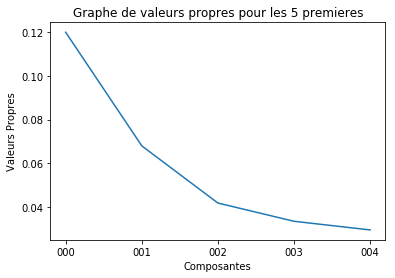

In [14]:
plt.plot(data["Composante"][:5], data["Total"][:5])
plt.title('Graphe de valeurs propres pour les 5 premieres')
plt.xlabel('Composantes')
plt.ylabel('Valeurs Propres')
plt.show()

In [ ]:
information = 0
i=0
while information <= 80:
    information += eigenVal[i]*100
    i+=1
print("\n\nNombre de facteurs necessaires pour nous garantir 80% de l'information expliquee : ",i," \n")
while information <= 90:
    information += eigenVal[i]*100
    i+=1
print("\n\nNombre de facteurs necessaires pour nous garantir 90% de l'information expliquee : ",i," \n")
while information <= 95:
    information += eigenVal[i]*100
    i+=1
print("\n\nNombre de facteurs necessaires pour nous garantir 95% de l'information expliquee : ",i," \n")